# Data Augmentation

El proceso de Data Augmentation consiste en realizar diversas transformaciones sobre los datos de entrada con el objetivo de aportar variabilidad e incrementar el tamaño de mi conjunto de datos, partiendo de los datos ya existentes y etiquetados. Dichas transformaciones puede ser, como vimos en teoria, de distintos tipos, sin embargo, es necesario tener en cuenta solo utilizar las que sean coherentes con el problema puntual sobre el que estamos trabajando.

Para este ejercicio vamos a trabajar con un dataset de imágenes de perros y gatos, el cual contiene 4000 imagenes a color, 2000 de perros y 2000 de gatos. Dichas imágenes ya se encuentran divididas en 3 carpetas correspondientes a entrenamiento, validación y testeo con 2000, 1000 y 1000 imágenes en cada una, respectivamente.

Podemos descargar el dataset al entorno de trabajo, desde una carpeta de Drive a partir de utilizar el ID del archivo dentro de Drive.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
import os
from PIL import Image

import torch
import torchvision
import torchsummary
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import Dataset

!pip install torchmetrics
import torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 529 kB 32.1 MB/s 


In [ ]:
# https://drive.google.com/file/d/1QEsn1vs35pi3AFcMzSfmZtOdfXn2AqxG/view?usp=sharing
# El ID sera: 1QEsn1vs35pi3AFcMzSfmZtOdfXn2AqxG
!gdown --id 1QEsn1vs35pi3AFcMzSfmZtOdfXn2AqxG

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1QEsn1vs35pi3AFcMzSfmZtOdfXn2AqxG
To: /content/perros_y_gatos.zip
100% 90.8M/90.8M [00:04<00:00, 21.2MB/s]


In [ ]:
!unzip /content/perros_y_gatos.zip > /dev/null

## Visualización de los datos

A partir de observar las distintas imágenes, podemos notar que no todas conservan las mismas dimensiones, por lo que será necesario realizar un redimensionamiento de forma tal que queden uniformes para un posible entrenamiento con capas convolucionales.

(374, 500, 3)


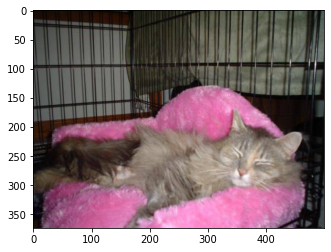

In [ ]:
import matplotlib.image as mpimg

image = mpimg.imread("train/cats/cat.120.jpg")

print(image.shape)
plt.imshow(image)

## Utilizar los datos

Para consumir los datos con nuestro modelo vamos a utilizar objetos de la clase DataLoader. Tambien, para poder cargar imágenes propias utilizamos la clase [`ImageFolder`](https://pytorch.org/vision/stable/generated/torchvision.datasets.ImageFolder.html?highlight=imagefolder#torchvision.datasets.ImageFolder), a la cual le pasamos el directorio donde se encuentran las imágenes a partir del cual infiere las clases dentro del dataset. Para mas información respecto a este punto ver [aquí](https://pytorch.org/vision/stable/generated/torchvision.datasets.DatasetFolder.html#torchvision.datasets.DatasetFolder).

In [ ]:
data_transforms = torchvision.transforms.Compose([
                    torchvision.transforms.Resize(size=(150, 150)),
                    torchvision.transforms.ToTensor()
                  ])

train_set = torchvision.datasets.ImageFolder(root='./train', transform=data_transforms)
valid_set = torchvision.datasets.ImageFolder(root='./validation', transform=data_transforms)
test_set = torchvision.datasets.ImageFolder(root='./test', transform=data_transforms)

train_loader = torch.utils.data.DataLoader(train_set, batch_size=32, shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_set, batch_size=32, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=32, shuffle=True)

Ahora defino una red neuronal contemplando la opción de que, si existe una GPU, se mueva la red allí para optimizar el entrenamiento.

In [ ]:
class ConvModel(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = torch.nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, stride=1, padding='same')
        self.pool1 = torch.nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = torch.nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, stride=1, padding='same')
        self.pool2 = torch.nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv3 = torch.nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding='same')
        self.pool3 = torch.nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv4 = torch.nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding='same')
        self.pool4 = torch.nn.MaxPool2d(kernel_size=2, stride=2)
        self.fc1 = torch.nn.Linear(in_features=10368, out_features=512)
        self.fc2 = torch.nn.Linear(in_features=512, out_features=2)

    def forward(self, x):
        x = self.pool1(torch.relu(self.conv1(x)))
        x = self.pool2(torch.relu(self.conv2(x)))
        x = self.pool3(torch.relu(self.conv3(x)))
        x = self.pool4(torch.relu(self.conv4(x)))
        x = torch.flatten(x, 1)
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        return x

conv_model = ConvModel()

# Si hay una GPU disponible muevo el modelo allí para aprovechar ese recurso
if torch.cuda.is_available():
    conv_model.to("cuda")

torchsummary.summary(conv_model, (3, 150, 150))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 150, 150]             448
         MaxPool2d-2           [-1, 16, 75, 75]               0
            Conv2d-3           [-1, 32, 75, 75]           4,640
         MaxPool2d-4           [-1, 32, 37, 37]               0
            Conv2d-5           [-1, 64, 37, 37]          18,496
         MaxPool2d-6           [-1, 64, 18, 18]               0
            Conv2d-7          [-1, 128, 18, 18]          73,856
         MaxPool2d-8            [-1, 128, 9, 9]               0
            Linear-9                  [-1, 512]       5,308,928
           Linear-10                    [-1, 2]           1,026
Total params: 5,407,394
Trainable params: 5,407,394
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.26
Forward/backward pass size (MB): 6.37
Params size (MB): 20.63
Estima

In [ ]:
conv_model_optimizer = torch.optim.Adam(conv_model.parameters(), lr=0.001)

conv_model_loss = torch.nn.CrossEntropyLoss()

conv_model_accuracy = torchmetrics.Accuracy()

writer = SummaryWriter(log_dir="runs/sin_data_aug")

# Agrego el grafico de la red a Tensorboard.
# [!] Debo pasarle una imagen por un bug en la funcion add_graph.
dataiter = iter(train_loader)
images, labels = dataiter.next()

if torch.cuda.is_available():
    images = images.to("cuda")
writer.add_graph(conv_model, images)

if torch.cuda.is_available():
  conv_model_accuracy.to("cuda")

# Epocas de entrenamiento
epochs = 20

# Defino listas para realizar graficas de los resultados
train_loss = []
train_acc = []
valid_loss = []
valid_acc = []

## Defino mi loop de entrenamiento

for epoch in range(epochs):

  epoch_train_loss = 0.0
  epoch_train_accuracy = 0.0

  for train_data, train_target in train_loader:

    # Al igual que con el modelo, los datos también se deben pasar a la GPU
    if torch.cuda.is_available():
      train_data = train_data.to("cuda")
      train_target = train_target.to("cuda")

    conv_model_optimizer.zero_grad()
    
    output = conv_model(train_data)
    
    loss = conv_model_loss(output, train_target)
    epoch_train_loss += loss.item()
    loss.backward()
    
    conv_model_optimizer.step()

    accuracy = conv_model_accuracy(output, train_target)
    epoch_train_accuracy += accuracy.item()

  # Calculo la media de error y accuracy para la epoca de entrenamiento.
  # La longitud de train_loader es igual a la cantidad de batches dentro de una epoca.
  epoch_train_loss = epoch_train_loss / len(train_loader)
  epoch_train_accuracy = epoch_train_accuracy / len(train_loader)
  train_loss.append(epoch_train_loss)
  train_acc.append(epoch_train_accuracy)

  # Realizo el paso de validación computando error y accuracy, y
  # almacenando los valores para imprimirlos y graficarlos
  epoch_valid_loss = 0.0
  epoch_valid_accuracy = 0.0

  for valid_data, valid_target in valid_loader:
    if torch.cuda.is_available():
      valid_data = valid_data.to("cuda")
      valid_target = valid_target.to("cuda")

    output = conv_model(valid_data)
    epoch_valid_loss += conv_model_loss(output, valid_target).item()
    epoch_valid_accuracy += conv_model_accuracy(output, valid_target).item()
      
  epoch_valid_loss = epoch_valid_loss / len(valid_loader)
  epoch_valid_accuracy = epoch_valid_accuracy / len(valid_loader)
  valid_loss.append(epoch_valid_loss)
  valid_acc.append(epoch_valid_accuracy)

  print("Epoch: {}/{} - Train loss {:.6f} - Train Accuracy {:.6f} - Valid Loss {:.6f} - Valid Accuracy {:.6f}".format(
      epoch+1, epochs, epoch_train_loss, epoch_train_accuracy, epoch_valid_loss, epoch_valid_accuracy))

  # Escribo los logs dentro de tensorboard
  writer.add_scalar("loss - train", epoch_train_loss, epoch)
  writer.add_scalar("loss - valid", epoch_valid_loss, epoch)
  writer.add_scalar("accuracy - train", epoch_train_accuracy, epoch)
  writer.add_scalar("accuracy - valid", epoch_valid_accuracy, epoch)
  writer.flush()

writer.close()

Epoch: 1/20 - Train loss 0.694376 - Train Accuracy 0.501984 - Valid Loss 0.691007 - Valid Accuracy 0.494141
Epoch: 2/20 - Train loss 0.693566 - Train Accuracy 0.501488 - Valid Loss 0.692591 - Valid Accuracy 0.502930
Epoch: 3/20 - Train loss 0.692940 - Train Accuracy 0.520833 - Valid Loss 0.691563 - Valid Accuracy 0.544922
Epoch: 4/20 - Train loss 0.686978 - Train Accuracy 0.553571 - Valid Loss 0.677141 - Valid Accuracy 0.580078
Epoch: 5/20 - Train loss 0.653193 - Train Accuracy 0.608631 - Valid Loss 0.689459 - Valid Accuracy 0.603516
Epoch: 6/20 - Train loss 0.625775 - Train Accuracy 0.641865 - Valid Loss 0.617421 - Valid Accuracy 0.654297
Epoch: 7/20 - Train loss 0.586528 - Train Accuracy 0.693452 - Valid Loss 0.604033 - Valid Accuracy 0.656250
Epoch: 8/20 - Train loss 0.553822 - Train Accuracy 0.713790 - Valid Loss 0.571796 - Valid Accuracy 0.692383
Epoch: 9/20 - Train loss 0.544709 - Train Accuracy 0.729167 - Valid Loss 0.578308 - Valid Accuracy 0.699219
Epoch: 10/20 - Train loss 0.

Realizo gráficas del resultado del entrenamiento para visualizar el comportamiento de las métricas a lo largo de las epocas.

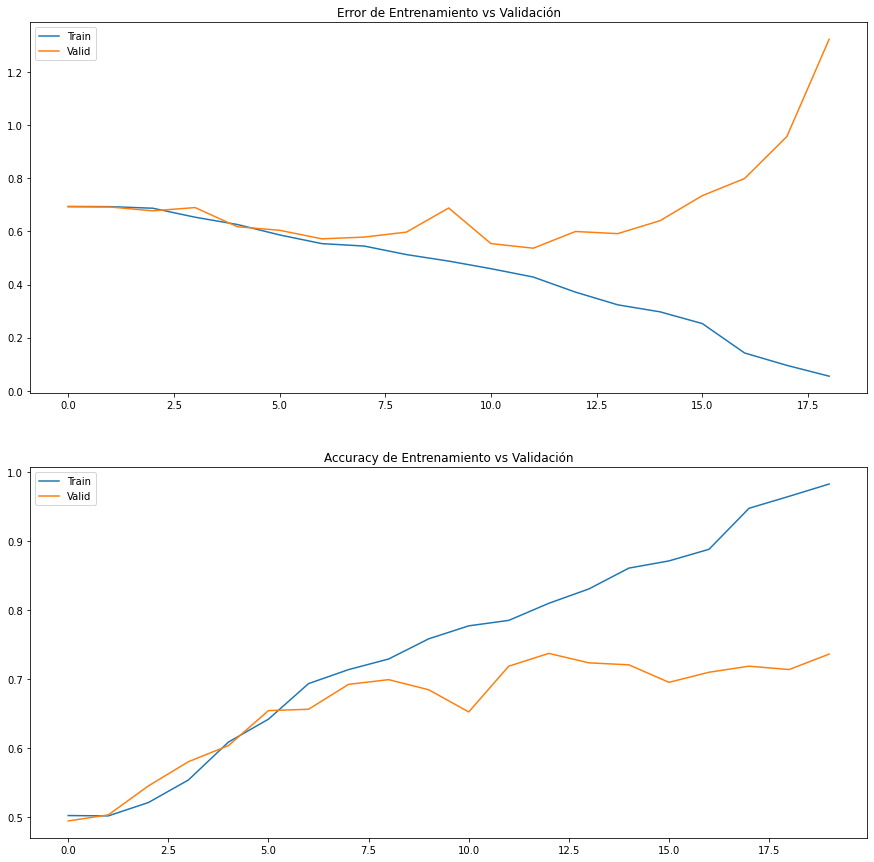

In [ ]:
fig, axs = plt.subplots(2, 1, figsize=(15,15))

axs[0].plot(train_loss[1:]) 
axs[0].plot(valid_loss[1:]) 
axs[0].title.set_text('Error de Entrenamiento vs Validación') 
axs[0].legend(['Train', 'Valid'])  

axs[1].plot(train_acc) 
axs[1].plot(valid_acc) 
axs[1].title.set_text('Accuracy de Entrenamiento vs Validación') 
axs[1].legend(['Train', 'Valid'])

Su puede observar una clara tendencia al sobreentrenamiento del modelo, el cual es debido a, entre otras cosas, la poca cantidad de datos de entrenamiento utilizados.

Si evaluo el modelo con el conjunto de testeo los resultados son:

In [ ]:
# Realizo el paso de evaluación computando error y accuracy
test_loss = 0.0
test_accuracy = 0.0

for test_data, test_target in test_loader:
  if torch.cuda.is_available():
        test_data, test_target = test_data.cuda(), test_target.cuda()
  output = conv_model(test_data)
  test_loss += conv_model_loss(output, test_target).item()
  test_accuracy += conv_model_accuracy(output, test_target).item()

test_loss = test_loss / len(test_loader)
test_accuracy = test_accuracy / len(test_loader)

print("El modelo logro un error de {:.6f} y una accuracy de {:.6f}".format(test_loss, test_accuracy))

El modelo logro un error de 1.283606 y una accuracy de 0.726562


---
## Aplicar Data Augmentation

Para aplicar Data Augmentation sobre los datos vamos a utilizar la misma composición de transformaciones que ya veniamos utilizando. Allí podemos agregar una serie de funciones listadas [`aquí`](https://pytorch.org/vision/stable/transforms.html). Para ver ejemplos de dichas transformaciones ver [este](https://pytorch.org/vision/stable/auto_examples/plot_transforms.html#sphx-glr-auto-examples-plot-transforms-py) link.

Ademas de las transformaciones implementadas dentro del modulo `torchvision` de Pytorch, podemos optar por utilizar librerias externas para dicho proposito e integrar sus transformaciones en el pipeline de entrenamiento de Pytorch.

In [ ]:
aug_data_transforms = torchvision.transforms.Compose([
                        torchvision.transforms.Resize(size=(150, 150)),
                        torchvision.transforms.RandomHorizontalFlip(0.5),
                        torchvision.transforms.RandomResizedCrop(size=(150, 150), scale=(0.5, 1.0)),
                        torchvision.transforms.ColorJitter(saturation=0.1, hue=0.1),
                        torchvision.transforms.ToTensor(),
                      ])

aug_train_set = torchvision.datasets.ImageFolder(root='./train', transform=aug_data_transforms)
aug_valid_set = torchvision.datasets.ImageFolder(root='./validation', transform=aug_data_transforms)

aug_train_loader = torch.utils.data.DataLoader(aug_train_set, batch_size=32, shuffle=True)
aug_valid_loader = torch.utils.data.DataLoader(aug_valid_set, batch_size=32, shuffle=True)

Podemos visualizar el resultado de aplicar dichas transformaciones sobre las imágenes de nuestro dataset. Aquí el metodo [`permute`](https://pytorch.org/docs/stable/generated/torch.permute.html#torch.permute) nos permite reordenar las dimensiones del tensor de (3, 150, 150) a (150, 150, 3).

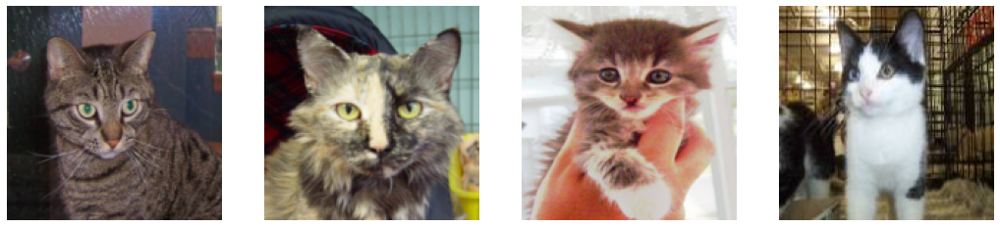

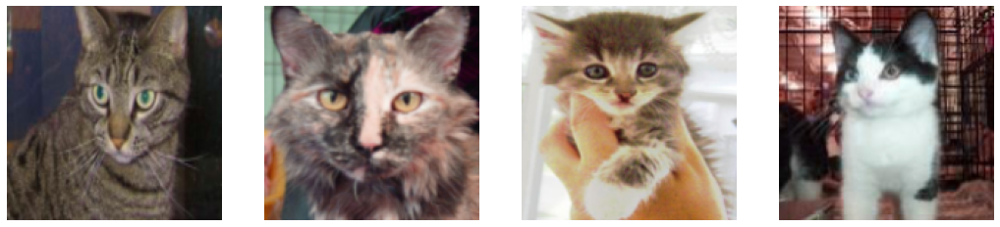

In [ ]:
# Ploteo las imagenes sin augmentacion

fig, rows = plt.subplots(nrows=1, ncols=4, figsize=(18, 18))

for id, row in enumerate(rows):
    row.imshow(train_set[id][0].permute(1, 2, 0))
    row.axis('off')
plt.show()

# Ploteo las mismas imagenes con augmentacion

fig, rows = plt.subplots(nrows=1, ncols=4, figsize=(18, 18))

for id, row in enumerate(rows):
    row.imshow(aug_train_set[id][0].permute(1, 2, 0))
    row.axis('off')
plt.show()

Si ahora, repito el proceso de entrenamiento, utilizando la misma arquitectura de red neuronal del caso anterior, pero pasandole datos sobre los que realizo las perturbaciones antes definidas, mi entrenamiento deberia ser más estable aunque un poco mas lento.

In [ ]:
aug_conv_model = ConvModel()

if torch.cuda.is_available():
  aug_conv_model = aug_conv_model.to("cuda")

aug_conv_model_optimizer = torch.optim.Adam(aug_conv_model.parameters(), lr=0.0001)

aug_conv_model_loss = torch.nn.CrossEntropyLoss()

aug_conv_model_accuracy = torchmetrics.Accuracy()

writer = SummaryWriter(log_dir="runs/con_data_aug")

if torch.cuda.is_available():
  aug_conv_model_accuracy = aug_conv_model_accuracy.to("cuda")

# Epocas de entrenamiento
epochs = 40

# Defino listas para realizar graficas de los resultados
train_loss = []
train_acc = []
valid_loss = []
valid_acc = []

## Defino mi loop de entrenamiento

for epoch in range(epochs):

  epoch_train_loss = 0.0
  epoch_train_accuracy = 0.0

  for aug_train_data, aug_train_target in aug_train_loader:

    if torch.cuda.is_available():
      aug_train_data = aug_train_data.to("cuda")
      aug_train_target = aug_train_target.to("cuda")

    aug_conv_model_optimizer.zero_grad()
    
    aug_output = aug_conv_model(aug_train_data)
    
    aug_loss = aug_conv_model_loss(aug_output, aug_train_target)
    epoch_train_loss += aug_loss.item()
    aug_loss.backward()
    
    aug_conv_model_optimizer.step()
    accuracy = aug_conv_model_accuracy(aug_output, aug_train_target)
    epoch_train_accuracy += accuracy.item()

  # Calculo la media de error y accuracy para la epoca de entrenamiento.
  # La longitud de train_loader es igual a la cantidad de batches dentro de una epoca.
  epoch_train_loss = epoch_train_loss / len(aug_train_loader)
  epoch_train_accuracy = epoch_train_accuracy / len(aug_train_loader)
  train_loss.append(epoch_train_loss)
  train_acc.append(epoch_train_accuracy)

  # Realizo el paso de validación computando error y accuracy, y
  # almacenando los valores para imprimirlos y graficarlos
  epoch_valid_loss = 0.0
  epoch_valid_accuracy = 0.0

  for aug_valid_data, aug_valid_target in aug_valid_loader:
    if torch.cuda.is_available():
      aug_valid_data = aug_valid_data.to("cuda")
      aug_valid_target = aug_valid_target.to("cuda")

    aug_output = aug_conv_model(aug_valid_data)
    epoch_valid_loss += aug_conv_model_loss(aug_output, aug_valid_target).item()
    epoch_valid_accuracy += aug_conv_model_accuracy(aug_output, aug_valid_target).item()
      
  epoch_valid_loss = epoch_valid_loss / len(aug_valid_loader)
  epoch_valid_accuracy = epoch_valid_accuracy / len(aug_valid_loader)
  valid_loss.append(epoch_valid_loss)
  valid_acc.append(epoch_valid_accuracy)

  print("Epoch: {}/{} - Train loss {:.6f} - Train Accuracy {:.6f} - Valid Loss {:.6f} - Valid Accuracy {:.6f}".format(
      epoch+1, epochs, epoch_train_loss, epoch_train_accuracy, epoch_valid_loss, epoch_valid_accuracy))
  
  # Escribo los logs dentro de tensorboard
  writer.add_scalar("loss - train", epoch_train_loss, epoch)
  writer.add_scalar("loss - valid", epoch_valid_loss, epoch)
  writer.add_scalar("accuracy - train", epoch_train_accuracy, epoch)
  writer.add_scalar("accuracy - valid", epoch_valid_accuracy, epoch)
  writer.flush()

writer.close()

Epoch: 1/40 - Train loss 0.693791 - Train Accuracy 0.515873 - Valid Loss 0.692628 - Valid Accuracy 0.523438
Epoch: 2/40 - Train loss 0.692191 - Train Accuracy 0.526786 - Valid Loss 0.690049 - Valid Accuracy 0.494141
Epoch: 3/40 - Train loss 0.685521 - Train Accuracy 0.562500 - Valid Loss 0.672826 - Valid Accuracy 0.636719
Epoch: 4/40 - Train loss 0.669658 - Train Accuracy 0.604167 - Valid Loss 0.655431 - Valid Accuracy 0.606445
Epoch: 5/40 - Train loss 0.651389 - Train Accuracy 0.623512 - Valid Loss 0.637533 - Valid Accuracy 0.625977
Epoch: 6/40 - Train loss 0.635963 - Train Accuracy 0.646329 - Valid Loss 0.641555 - Valid Accuracy 0.625000
Epoch: 7/40 - Train loss 0.619886 - Train Accuracy 0.664683 - Valid Loss 0.616058 - Valid Accuracy 0.664062
Epoch: 8/40 - Train loss 0.608824 - Train Accuracy 0.683036 - Valid Loss 0.609572 - Valid Accuracy 0.666016
Epoch: 9/40 - Train loss 0.605307 - Train Accuracy 0.667659 - Valid Loss 0.611296 - Valid Accuracy 0.662109
Epoch: 10/40 - Train loss 0.

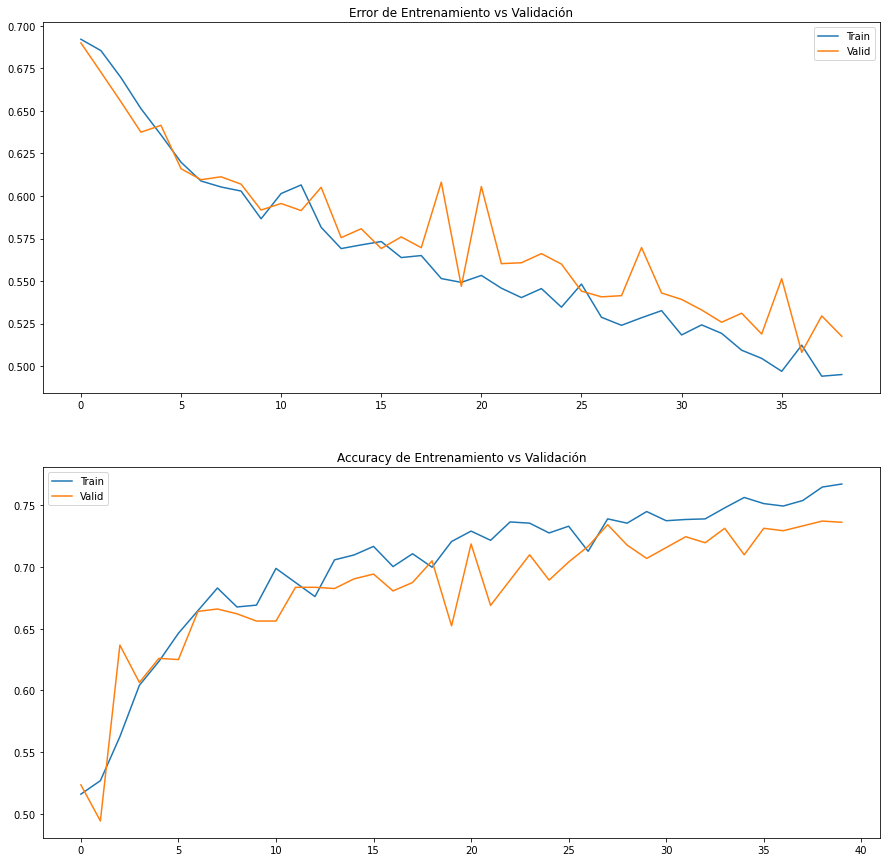

In [ ]:
fig, axs = plt.subplots(2, 1, figsize=(15,15))

axs[0].plot(train_loss[1:]) 
axs[0].plot(valid_loss[1:]) 
axs[0].title.set_text('Error de Entrenamiento vs Validación') 
axs[0].legend(['Train', 'Valid'])  

axs[1].plot(train_acc) 
axs[1].plot(valid_acc) 
axs[1].title.set_text('Accuracy de Entrenamiento vs Validación') 
axs[1].legend(['Train', 'Valid'])

Luego de entrenar, evaluo el modelo con los datos de testeo sin aplicarles data augmentation

In [ ]:
# Realizo el paso de evaluación computando error y accuracy
test_loss = 0.0
test_accuracy = 0.0

for test_data, test_target in test_loader:
  if torch.cuda.is_available():
        test_data, test_target = test_data.cuda(), test_target.cuda()
  output = aug_conv_model(test_data)
  test_loss += aug_conv_model_loss(output, test_target).item()
  test_accuracy += aug_conv_model_accuracy(output, test_target).item()

test_loss = test_loss / len(test_loader)
test_accuracy = test_accuracy / len(test_loader)

print("El modelo logro un error de {:.6f} y una accuracy de {:.6f}".format(test_loss, test_accuracy))

El modelo logro un error de 0.581235 y una accuracy de 0.701172


## TensorBoard

Otra forma de visualizar los resultados del entrenamiento de nuestra red es mediante la herramienta TensorBoard, la cual forma parte del framework de Tensorflow. Esta herramienta nos permite ver graficas interactivas de la evolución de las distintas metricas a lo largo de las epocas o las iteraciones de entrenamiento, así como también un grafo de las conexiones que componen nuestro modelo, entre otras cosas.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

---
# Albumentations

Además de utilizar las funciones para data augmentation provistas por el paquete `torchvision`, Pytorch nos permite generar el pipeline utilizando librerias externas. Una opción para hacer esto es [Albumentations](https://albumentations.ai/). Esta libreria provee una amplia variedad de funciones con todo tipo de transformaciones, sin embargo, una de las principales ventajas es la optimizacion del tiempo de computo.

Para utilizar esta libreria debemos definir nuestra propia clase que hereda de `Dataset` dado que la composicion de transformaciones que podemos generar con Albumentations no es compatible con los objetos `Dataset` que tiene predefinidos Pytorch. Por ejemplo, la clase que se implementa a continuación tiene el mismo compotamiento que [`ImageFolder`](https://pytorch.org/vision/stable/generated/torchvision.datasets.ImageFolder.html?highlight=imagefolder#torchvision.datasets.ImageFolder) de Pytorch.

La clase definida es `AlbumImageFolder`, la cual, ademas de devolver las imagenes y sus clases, devuelve el tiempo que demoro en computar el metodo `__getitem__`. Este metodo nos permitira comparar los tiempos de procesamiento con un pipeline definido utilizando los métodos de `torchvision`. La clase `TorchImageFolder` es similar a `ImageFolder` de Pytorch con el agregado que tambien mide el tiempo antes mencionado para realizar la comparación.

In [ ]:
class AlbumImageFolder(Dataset):
    def __init__(self, file_path, transform=None, with_time=False):
        self.file_path = file_path
        self.with_time = with_time
        self.transform = transform
        self.samples = []

        classes = sorted(entry.name for entry in os.scandir(self.file_path) if entry.is_dir())
        class_to_idx = {cls_name: i for i, cls_name in enumerate(classes)}

        for target_class in sorted(class_to_idx.keys()):
            class_index = class_to_idx[target_class]
            target_dir = os.path.join(self.file_path, target_class)
            for root, _, fnames in sorted(os.walk(target_dir, followlinks=True)):
                for fname in sorted(fnames):
                    path = os.path.join(root, fname)
                    item = path, class_index
                    self.samples.append(item)

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        start_time = time.time()
        label = self.samples[idx][-1]
        file_path = self.samples[idx][0]
        
        image = cv2.imread(file_path)
        
        if self.transform:
            image = self.transform(image=image)["image"]

        total_time = time.time() - start_time

        if self.with_time:
            return image, label, total_time
        else:
            return image, label


class TorchImageFolder(Dataset):
    def __init__(self, file_path, transform=None, with_time=False):
        self.file_path = file_path
        self.with_time = with_time
        self.transform = transform
        self.samples = []

        classes = sorted(entry.name for entry in os.scandir(self.file_path) if entry.is_dir())
        class_to_idx = {cls_name: i for i, cls_name in enumerate(classes)}

        for target_class in sorted(class_to_idx.keys()):
            class_index = class_to_idx[target_class]
            target_dir = os.path.join(self.file_path, target_class)
            for root, _, fnames in sorted(os.walk(target_dir, followlinks=True)):
                for fname in sorted(fnames):
                    path = os.path.join(root, fname)
                    item = path, class_index
                    self.samples.append(item)

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        start_time = time.time()
        label = self.samples[idx][-1]
        file_path = self.samples[idx][0]
        
        image = Image.open(file_path)
        
        if self.transform:
            image = self.transform(image)

        total_time = time.time() - start_time
        
        if self.with_time:
            return image, label, total_time
        else:
            return image, label

### Albumentation Demo

Dentro del apagina web de la librería existe una aplicación web demo para testear el efecto que tiene cada una de las funciones de augmentacion diponible. El link para ese demo es el siguiente: [link a demo](https://demo.albumentations.ai/)

In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

albumentations_transform = A.Compose([
    A.Resize(150, 150),
    A.HorizontalFlip(0.5),
    A.RandomResizedCrop(150, 150, scale=(0.5, 1.0)), 
    A.ColorJitter(saturation=0.05, hue=0.05),
    ToTensorV2()
])

albu_train_set = AlbumImageFolder(file_path='./train', transform=albumentations_transform, with_time=True)
albu_valid_set = AlbumImageFolder(file_path='./validation', transform=albumentations_transform)

albu_train_loader = torch.utils.data.DataLoader(albu_train_set, batch_size=32, shuffle=True)
albu_valid_loader = torch.utils.data.DataLoader(albu_valid_set, batch_size=32, shuffle=True)

## Tiempo de procesamiento

A continuación se compara el tiempo de procesamiento de los pipelines de datos definidos con Albumentations y con Torchvision. 

In [ ]:
aug_train_set = TorchImageFolder(file_path='./train', transform=aug_data_transforms, with_time=True)

# Mido el tiempo de procesamiento de ambos pipelines de Data Augmentation

total_time = 0
for i in range(300):
  _, _, transform_time = aug_train_set[0]
  total_time += transform_time

print("Torchvision time/sample: {} ms".format(total_time*10))

total_time = 0
for i in range(300):
  _, _, transform_time = albu_train_set[0]
  total_time += transform_time

print("Albumentation time/sample: {} ms".format(total_time*10))

Torchvision time/sample: 14.0806245803833 ms
Albumentation time/sample: 5.030016899108887 ms
